In [1]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import BatchNormalization, Dropout, Flatten, Dense, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.applications import EfficientNetB3

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import cv2
import os

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
image_size = 350
batch_size = 8
save_model_filename = 'effnet.h5'

In [5]:
train = pd.read_csv('../input/cassava-leaf-disease-classification/train.csv')
train_path = '../input/cassava-leaf-disease-classification/train_images'

In [6]:
def image_path(image):
    return os.path.join(train_path,image)

train['image_id'] = train['image_id'].apply(image_path)

In [7]:
train['label'] = train['label'].astype('str')

In [8]:
image_gen = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
                                horizontal_flip=True, vertical_flip=True, fill_mode='nearest', brightness_range=[-1.0, 3.0],
                                rotation_range=45, zoom_range=0.2, shear_range=10, width_shift_range = 0.2, height_shift_range = 0.2,
                                validation_split=0.2, rescale = 1./255)

test_gen = ImageDataGenerator(rescale=1./255)

In [9]:
train_generator = image_gen.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                subset='training', batch_size=batch_size, seed=34,
                                                shuffle=True, class_mode='categorical', target_size=(image_size,image_size))

validation_generator = image_gen.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                   subset='validation', batch_size=batch_size, seed=34,
                                                   shuffle=False, class_mode='categorical', target_size=(image_size,image_size))

Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


In [10]:
def build_efficientnet_b3():
    model = Sequential()
    model.add(EfficientNetB3(input_shape = (image_size,image_size,3), include_top = False, weights = 'imagenet', drop_connect_rate=0.4))
    model.add(GlobalAveragePooling2D())
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(5, activation = 'softmax'))
    
    return model

In [11]:
model = build_efficientnet_b3()
model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalN

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localh

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/repl

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/r

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/re

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:lo

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localh

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/repl

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localho

Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/repl

Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /jo

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job

Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/re

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializ

In [12]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-3),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [13]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3, restore_best_weights=True)
model_checkpoint = ModelCheckpoint(save_model_filename, monitor='val_loss', mode='min', verbose=1, save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', mode='min', factor=0.2, patience=2, min_lr=1e-6, verbose=1)

C:\Users\pomat\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


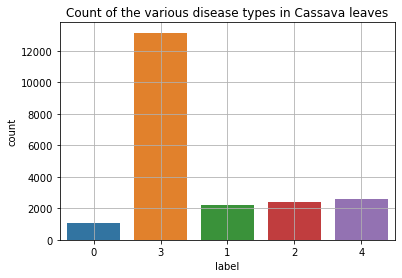

In [14]:
import seaborn as sns

sns.countplot(train['label'])
plt.title('Count of the various disease types in Cassava leaves')
plt.grid()
plt.show()

In [15]:
epoch = 20

history = model.fit(
    train_generator,
    epochs=epoch,
    batch_size=batch_size,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0
   2/2140 [..............................] - ETA: 4:13 - loss: 1.5497 - accuracy: 0.3125WARNING:tensorflow:Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0908s vs `on_train_batch_end` time: 0.1456s). Check your callbacks.
Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0
  42/2140 [..............................] - ETA: 8:11 - loss: 1.4491 - accuracy: 0.4940Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  85/2140 [>.............................] - ETA: 8:07 - loss: 1.3535 - accuracy: 0.5632Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 128/2140 [>.............................] - ETA: 7:59 - loss: 1.2943 - accuracy: 0.5830Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 171/2140 [=>............................] - ETA: 7:51 - loss: 1.2593 - accuracy: 0.5936Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 214/2140 [==>...........................] - ETA: 7:41 - loss: 1.2400 - accuracy: 0.6016Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 257/2140 [==>...........................] - ETA: 7:32 - loss: 1.2158 - accuracy: 0.6060Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 300/2140 [===>..........................] - ETA: 7:22 - loss: 1.2043 - accuracy: 0.6104Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 343/2140 [===>..........................] - ETA: 7:12 - loss: 1.2080 - accuracy: 0.6053Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 386/2140 [====>.........................] - ETA: 7:01 - loss: 1.1896 - accuracy: 0.6104Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 429/2140 [=====>........................] - ETA: 6:51 - loss: 1.1848 - accuracy: 0.6087Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 472/2140 [=====>........................] - ETA: 6:40 - loss: 1.1792 - accuracy: 0.6091Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 515/2140 [======>.......................] - ETA: 6:30 - loss: 1.1722 - accuracy: 0.6080Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 558/2140 [======>.......................] - ETA: 6:20 - loss: 1.1648 - accuracy: 0.6089Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 601/2140 [=======>......................] - ETA: 6:10 - loss: 1.1587 - accuracy: 0.6106Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 644/2140 [========>.....................] - ETA: 6:00 - loss: 1.1493 - accuracy: 0.6130Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 687/2140 [========>.....................] - ETA: 5:49 - loss: 1.1444 - accuracy: 0.6163Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 730/2140 [=========>....................] - ETA: 5:39 - loss: 1.1428 - accuracy: 0.6161Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 773/2140 [=========>....................] - ETA: 5:29 - loss: 1.1365 - accuracy: 0.6190Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 816/2140 [==========>...................] - ETA: 5:18 - loss: 1.1287 - accuracy: 0.6218Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 859/2140 [===========>..................] - ETA: 5:08 - loss: 1.1243 - accuracy: 0.6227Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 902/2140 [===========>..................] - ETA: 4:57 - loss: 1.1237 - accuracy: 0.6231Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 945/2140 [============>.................] - ETA: 4:47 - loss: 1.1204 - accuracy: 0.6230Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 988/2140 [============>.................] - ETA: 4:37 - loss: 1.1210 - accuracy: 0.6217Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1031/2140 [=============>................] - ETA: 4:26 - loss: 1.1150 - accuracy: 0.6237Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1074/2140 [==============>...............] - ETA: 4:16 - loss: 1.1103 - accuracy: 0.6256Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1117/2140 [==============>...............] - ETA: 4:06 - loss: 1.1094 - accuracy: 0.6253Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1160/2140 [===============>..............] - ETA: 3:56 - loss: 1.1070 - accuracy: 0.6262Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1203/2140 [===============>..............] - ETA: 3:46 - loss: 1.1047 - accuracy: 0.6262Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1246/2140 [================>.............] - ETA: 3:35 - loss: 1.1022 - accuracy: 0.6265Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1289/2140 [=================>............] - ETA: 3:25 - loss: 1.0999 - accuracy: 0.6260Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1332/2140 [=================>............] - ETA: 3:15 - loss: 1.0969 - accuracy: 0.6262Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1375/2140 [==================>...........] - ETA: 3:04 - loss: 1.0920 - accuracy: 0.6276Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1418/2140 [==================>...........] - ETA: 2:54 - loss: 1.0917 - accuracy: 0.6269Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1461/2140 [===================>..........] - ETA: 2:43 - loss: 1.0874 - accuracy: 0.6283Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1504/2140 [====================>.........] - ETA: 2:33 - loss: 1.0814 - accuracy: 0.6298Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1547/2140 [====================>.........] - ETA: 2:23 - loss: 1.0813 - accuracy: 0.6295Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1590/2140 [=====================>........] - ETA: 2:12 - loss: 1.0801 - accuracy: 0.6296Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1633/2140 [=====================>........] - ETA: 2:02 - loss: 1.0785 - accuracy: 0.6300Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1676/2140 [======================>.......] - ETA: 1:51 - loss: 1.0748 - accuracy: 0.6316Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1719/2140 [=======================>......] - ETA: 1:41 - loss: 1.0751 - accuracy: 0.6314Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1762/2140 [=======================>......] - ETA: 1:31 - loss: 1.0753 - accuracy: 0.6317Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1805/2140 [========================>.....] - ETA: 1:20 - loss: 1.0748 - accuracy: 0.6319Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1848/2140 [========================>.....] - ETA: 1:10 - loss: 1.0736 - accuracy: 0.6316Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1891/2140 [=========================>....] - ETA: 59s - loss: 1.0719 - accuracy: 0.6321 Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1935/2140 [==========================>...] - ETA: 49s - loss: 1.0740 - accuracy: 0.6305Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1979/2140 [==========================>...] - ETA: 38s - loss: 1.0710 - accuracy: 0.6317Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2023/2140 [===========================>..] - ETA: 28s - loss: 1.0708 - accuracy: 0.6318Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2067/2140 [===========================>..] - ETA: 17s - loss: 1.0688 - accuracy: 0.6324Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2111/2140 [============================>.] - ETA: 6s - loss: 1.0673 - accuracy: 0.6328Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 1.0664 - accuracy: 0.6331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0

Epoch 00001: val_loss improved from inf

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:08 - loss: 0.9225 - accuracy: 0.6729Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:04 - loss: 0.9357 - accuracy: 0.6681Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:55 - loss: 0.9427 - accuracy: 0.6673Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:45 - loss: 0.9758 - accuracy: 0.6584Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:36 - loss: 0.9655 - accuracy: 0.6627Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:26 - loss: 0.9828 - accuracy: 0.6574Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:16 - loss: 0.9858 - accuracy: 0.6553Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:06 - loss: 0.9837 - accuracy: 0.6534Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:56 - loss: 0.9697 - accuracy: 0.6592Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:47 - loss: 0.9675 - accuracy: 0.6604Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:37 - loss: 0.9696 - accuracy: 0.6580Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:27 - loss: 0.9692 - accuracy: 0.6577Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:17 - loss: 0.9786 - accuracy: 0.6508Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:06 - loss: 0.9790 - accuracy: 0.6521Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:56 - loss: 0.9792 - accuracy: 0.6514Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:46 - loss: 0.9776 - accuracy: 0.6527Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:36 - loss: 0.9820 - accuracy: 0.6507Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:26 - loss: 0.9804 - accuracy: 0.6519Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:15 - loss: 0.9777 - accuracy: 0.6540Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:05 - loss: 0.9741 - accuracy: 0.6557Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:55 - loss: 0.9770 - accuracy: 0.6534Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:45 - loss: 0.9719 - accuracy: 0.6554Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:34 - loss: 0.9705 - accuracy: 0.6564Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:24 - loss: 0.9690 - accuracy: 0.6571Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:14 - loss: 0.9657 - accuracy: 0.6587Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.9685 - accuracy: 0.6581Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:53 - loss: 0.9696 - accuracy: 0.6587Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:43 - loss: 0.9699 - accuracy: 0.6577Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.9691 - accuracy: 0.6584Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.9664 - accuracy: 0.6597Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:12 - loss: 0.9666 - accuracy: 0.6598Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:01 - loss: 0.9673 - accuracy: 0.6597Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.9631 - accuracy: 0.6613Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.9623 - accuracy: 0.6621Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:31 - loss: 0.9644 - accuracy: 0.6618Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.9653 - accuracy: 0.6608Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.9625 - accuracy: 0.6619Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 2:00 - loss: 0.9649 - accuracy: 0.6611Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.9642 - accuracy: 0.6617Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.9643 - accuracy: 0.6618Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.9648 - accuracy: 0.6620Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:19 - loss: 0.9636 - accuracy: 0.6620Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.9629 - accuracy: 0.6621Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.9616 - accuracy: 0.6629Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.9598 - accuracy: 0.6636Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.9571 - accuracy: 0.6646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.9546 - accuracy: 0.6653Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.9532 - accuracy: 0.6656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.9502 - accuracy: 0.6667Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.9503 - accuracy: 0.6669Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:07 - loss: 0.8461 - accuracy: 0.6968Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:03 - loss: 0.8339 - accuracy: 0.7069Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:54 - loss: 0.8768 - accuracy: 0.7002Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:45 - loss: 0.8928 - accuracy: 0.6903Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:36 - loss: 0.9091 - accuracy: 0.6781Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:26 - loss: 0.8973 - accuracy: 0.6823Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:16 - loss: 0.8954 - accuracy: 0.6824Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:06 - loss: 0.8971 - accuracy: 0.6818Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:56 - loss: 0.9012 - accuracy: 0.6813Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:46 - loss: 0.9015 - accuracy: 0.6843Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:36 - loss: 0.9028 - accuracy: 0.6837Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:26 - loss: 0.9028 - accuracy: 0.6844Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:15 - loss: 0.8994 - accuracy: 0.6847Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:05 - loss: 0.8932 - accuracy: 0.6868Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:54 - loss: 0.9006 - accuracy: 0.6854Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:45 - loss: 0.9038 - accuracy: 0.6841Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:35 - loss: 0.9002 - accuracy: 0.6863Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:24 - loss: 0.8991 - accuracy: 0.6864Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:14 - loss: 0.8966 - accuracy: 0.6885Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:04 - loss: 0.8979 - accuracy: 0.6884Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:54 - loss: 0.8965 - accuracy: 0.6889Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:44 - loss: 0.8935 - accuracy: 0.6897Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:33 - loss: 0.8911 - accuracy: 0.6905Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:23 - loss: 0.8942 - accuracy: 0.6895Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:13 - loss: 0.8916 - accuracy: 0.6908Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.8932 - accuracy: 0.6907Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:52 - loss: 0.8954 - accuracy: 0.6905Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:42 - loss: 0.8974 - accuracy: 0.6895Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.8948 - accuracy: 0.6900Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.8950 - accuracy: 0.6900Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:11 - loss: 0.8962 - accuracy: 0.6899Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:01 - loss: 0.8944 - accuracy: 0.6904Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.8936 - accuracy: 0.6910Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.8930 - accuracy: 0.6909Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:30 - loss: 0.8928 - accuracy: 0.6911Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.8953 - accuracy: 0.6903Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.8940 - accuracy: 0.6916Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 2:00 - loss: 0.8937 - accuracy: 0.6912Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.8939 - accuracy: 0.6905Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.8938 - accuracy: 0.6904Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.8930 - accuracy: 0.6905Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:18 - loss: 0.8903 - accuracy: 0.6917Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.8913 - accuracy: 0.6918Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.8915 - accuracy: 0.6920Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.8918 - accuracy: 0.6911Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.8896 - accuracy: 0.6919Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.8903 - accuracy: 0.6920Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.8896 - accuracy: 0.6926Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.8891 - accuracy: 0.6925Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.8878 - accuracy: 0.6931Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  71/2140 [..............................] - ETA: 8:08 - loss: 0.8883 - accuracy: 0.6884Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 114/2140 [>.............................] - ETA: 8:00 - loss: 0.8830 - accuracy: 0.6952Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 157/2140 [=>............................] - ETA: 7:52 - loss: 0.8675 - accuracy: 0.7006Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 200/2140 [=>............................] - ETA: 7:42 - loss: 0.8549 - accuracy: 0.7044Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 243/2140 [==>...........................] - ETA: 7:33 - loss: 0.8442 - accuracy: 0.7083Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 286/2140 [===>..........................] - ETA: 7:23 - loss: 0.8510 - accuracy: 0.7072Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 329/2140 [===>..........................] - ETA: 7:12 - loss: 0.8651 - accuracy: 0.6987Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 372/2140 [====>.........................] - ETA: 7:02 - loss: 0.8612 - accuracy: 0.6996Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 415/2140 [====>.........................] - ETA: 6:52 - loss: 0.8686 - accuracy: 0.6967Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 458/2140 [=====>........................] - ETA: 6:41 - loss: 0.8758 - accuracy: 0.6916Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 501/2140 [======>.......................] - ETA: 6:31 - loss: 0.8826 - accuracy: 0.6891Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 544/2140 [======>.......................] - ETA: 6:21 - loss: 0.8792 - accuracy: 0.6893Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 587/2140 [=======>......................] - ETA: 6:11 - loss: 0.8783 - accuracy: 0.6897Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 630/2140 [=======>......................] - ETA: 6:01 - loss: 0.8800 - accuracy: 0.6901Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 673/2140 [========>.....................] - ETA: 5:50 - loss: 0.8795 - accuracy: 0.6917Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 716/2140 [=========>....................] - ETA: 5:40 - loss: 0.8752 - accuracy: 0.6937Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 759/2140 [=========>....................] - ETA: 5:30 - loss: 0.8716 - accuracy: 0.6954Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 802/2140 [==========>...................] - ETA: 5:19 - loss: 0.8723 - accuracy: 0.6952Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 845/2140 [==========>...................] - ETA: 5:09 - loss: 0.8677 - accuracy: 0.6980Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 888/2140 [===========>..................] - ETA: 4:59 - loss: 0.8695 - accuracy: 0.6970Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 931/2140 [============>.................] - ETA: 4:49 - loss: 0.8691 - accuracy: 0.6965Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 974/2140 [============>.................] - ETA: 4:38 - loss: 0.8686 - accuracy: 0.6965Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1017/2140 [=============>................] - ETA: 4:28 - loss: 0.8691 - accuracy: 0.6968Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1060/2140 [=============>................] - ETA: 4:18 - loss: 0.8679 - accuracy: 0.6973Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1103/2140 [==============>...............] - ETA: 4:07 - loss: 0.8666 - accuracy: 0.6978Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1146/2140 [===============>..............] - ETA: 3:57 - loss: 0.8649 - accuracy: 0.6985Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1189/2140 [===============>..............] - ETA: 3:47 - loss: 0.8653 - accuracy: 0.6986Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1232/2140 [================>.............] - ETA: 3:37 - loss: 0.8665 - accuracy: 0.6981Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1275/2140 [================>.............] - ETA: 3:26 - loss: 0.8665 - accuracy: 0.6987Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1318/2140 [=================>............] - ETA: 3:16 - loss: 0.8632 - accuracy: 0.7002Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1361/2140 [==================>...........] - ETA: 3:06 - loss: 0.8657 - accuracy: 0.6998Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1404/2140 [==================>...........] - ETA: 2:56 - loss: 0.8673 - accuracy: 0.6987Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1447/2140 [===================>..........] - ETA: 2:45 - loss: 0.8678 - accuracy: 0.6988Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1490/2140 [===================>..........] - ETA: 2:35 - loss: 0.8682 - accuracy: 0.6986Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1533/2140 [====================>.........] - ETA: 2:25 - loss: 0.8666 - accuracy: 0.6993Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1576/2140 [=====================>........] - ETA: 2:14 - loss: 0.8659 - accuracy: 0.6999Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1619/2140 [=====================>........] - ETA: 2:04 - loss: 0.8662 - accuracy: 0.7000Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1662/2140 [======================>.......] - ETA: 1:54 - loss: 0.8665 - accuracy: 0.6998Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1705/2140 [======================>.......] - ETA: 1:44 - loss: 0.8658 - accuracy: 0.7001Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1748/2140 [=======================>......] - ETA: 1:33 - loss: 0.8634 - accuracy: 0.7013Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1791/2140 [========================>.....] - ETA: 1:23 - loss: 0.8642 - accuracy: 0.7012Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1834/2140 [========================>.....] - ETA: 1:13 - loss: 0.8625 - accuracy: 0.7019Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1877/2140 [=========================>....] - ETA: 1:02 - loss: 0.8626 - accuracy: 0.7020Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1921/2140 [=========================>....] - ETA: 52s - loss: 0.8618 - accuracy: 0.7018Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1965/2140 [==========================>...] - ETA: 41s - loss: 0.8591 - accuracy: 0.7027Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2009/2140 [===========================>..] - ETA: 31s - loss: 0.8596 - accuracy: 0.7030Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2053/2140 [===========================>..] - ETA: 20s - loss: 0.8598 - accuracy: 0.7030Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2097/2140 [============================>.] - ETA: 10s - loss: 0.8595 - accuracy: 0.7031Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.8588 - accuracy: 0.7033Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:lo

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  51/2140 [..............................] - ETA: 8:06 - loss: 0.8114 - accuracy: 0.7315Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  94/2140 [>.............................] - ETA: 8:02 - loss: 0.8441 - accuracy: 0.7040Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 137/2140 [>.............................] - ETA: 7:55 - loss: 0.8259 - accuracy: 0.7075Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 180/2140 [=>............................] - ETA: 7:46 - loss: 0.8030 - accuracy: 0.7184Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 223/2140 [==>...........................] - ETA: 7:36 - loss: 0.8140 - accuracy: 0.7183Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 266/2140 [==>...........................] - ETA: 7:26 - loss: 0.8055 - accuracy: 0.7215Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 309/2140 [===>..........................] - ETA: 7:17 - loss: 0.7947 - accuracy: 0.7275Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 352/2140 [===>..........................] - ETA: 7:07 - loss: 0.7881 - accuracy: 0.7285Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 395/2140 [====>.........................] - ETA: 6:57 - loss: 0.7851 - accuracy: 0.7286Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 438/2140 [=====>........................] - ETA: 6:46 - loss: 0.7961 - accuracy: 0.7253Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 481/2140 [=====>........................] - ETA: 6:36 - loss: 0.7971 - accuracy: 0.7241Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 524/2140 [======>.......................] - ETA: 6:26 - loss: 0.7986 - accuracy: 0.7224Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 567/2140 [======>.......................] - ETA: 6:16 - loss: 0.8019 - accuracy: 0.7223Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 610/2140 [=======>......................] - ETA: 6:05 - loss: 0.7982 - accuracy: 0.7237Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 653/2140 [========>.....................] - ETA: 5:55 - loss: 0.7944 - accuracy: 0.7258Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 696/2140 [========>.....................] - ETA: 5:45 - loss: 0.7950 - accuracy: 0.7258Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 739/2140 [=========>....................] - ETA: 5:35 - loss: 0.7942 - accuracy: 0.7271Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 782/2140 [=========>....................] - ETA: 5:24 - loss: 0.7931 - accuracy: 0.7272Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 825/2140 [==========>...................] - ETA: 5:14 - loss: 0.7886 - accuracy: 0.7295Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 868/2140 [===========>..................] - ETA: 5:04 - loss: 0.7849 - accuracy: 0.7316Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 911/2140 [===========>..................] - ETA: 4:53 - loss: 0.7893 - accuracy: 0.7299Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 954/2140 [============>.................] - ETA: 4:43 - loss: 0.7882 - accuracy: 0.7299Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 997/2140 [============>.................] - ETA: 4:32 - loss: 0.7854 - accuracy: 0.7316Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1040/2140 [=============>................] - ETA: 4:22 - loss: 0.7830 - accuracy: 0.7326Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1083/2140 [==============>...............] - ETA: 4:12 - loss: 0.7857 - accuracy: 0.7318Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1126/2140 [==============>...............] - ETA: 4:02 - loss: 0.7857 - accuracy: 0.7321Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1169/2140 [===============>..............] - ETA: 3:52 - loss: 0.7803 - accuracy: 0.7351Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1212/2140 [===============>..............] - ETA: 3:41 - loss: 0.7839 - accuracy: 0.7333Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1255/2140 [================>.............] - ETA: 3:31 - loss: 0.7806 - accuracy: 0.7345Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1298/2140 [=================>............] - ETA: 3:21 - loss: 0.7809 - accuracy: 0.7350Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1341/2140 [=================>............] - ETA: 3:11 - loss: 0.7803 - accuracy: 0.7351Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1384/2140 [==================>...........] - ETA: 3:00 - loss: 0.7785 - accuracy: 0.7359Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1427/2140 [===================>..........] - ETA: 2:50 - loss: 0.7808 - accuracy: 0.7348Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1470/2140 [===================>..........] - ETA: 2:40 - loss: 0.7814 - accuracy: 0.7346Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1513/2140 [====================>.........] - ETA: 2:29 - loss: 0.7787 - accuracy: 0.7353Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1556/2140 [====================>.........] - ETA: 2:19 - loss: 0.7776 - accuracy: 0.7357Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1599/2140 [=====================>........] - ETA: 2:09 - loss: 0.7761 - accuracy: 0.7357Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1642/2140 [======================>.......] - ETA: 1:59 - loss: 0.7768 - accuracy: 0.7348Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1685/2140 [======================>.......] - ETA: 1:48 - loss: 0.7754 - accuracy: 0.7351Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1728/2140 [=======================>......] - ETA: 1:38 - loss: 0.7746 - accuracy: 0.7353Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1771/2140 [=======================>......] - ETA: 1:28 - loss: 0.7748 - accuracy: 0.7354Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1814/2140 [========================>.....] - ETA: 1:17 - loss: 0.7755 - accuracy: 0.7351Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1857/2140 [=========================>....] - ETA: 1:07 - loss: 0.7739 - accuracy: 0.7358Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1900/2140 [=========================>....] - ETA: 57s - loss: 0.7736 - accuracy: 0.7361Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1944/2140 [==========================>...] - ETA: 46s - loss: 0.7716 - accuracy: 0.7368Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1988/2140 [==========================>...] - ETA: 36s - loss: 0.7717 - accuracy: 0.7369Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2032/2140 [===========================>..] - ETA: 25s - loss: 0.7695 - accuracy: 0.7377Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2076/2140 [============================>.] - ETA: 15s - loss: 0.7677 - accuracy: 0.7386Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2120/2140 [============================>.] - ETA: 4s - loss: 0.7665 - accuracy: 0.7391Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.7662 - accuracy: 0.7395Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Read

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:10 - loss: 0.6009 - accuracy: 0.8032Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:04 - loss: 0.7404 - accuracy: 0.7458Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:56 - loss: 0.7563 - accuracy: 0.7350Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:47 - loss: 0.7638 - accuracy: 0.7322Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:37 - loss: 0.7475 - accuracy: 0.7397Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:27 - loss: 0.7584 - accuracy: 0.7385Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:17 - loss: 0.7684 - accuracy: 0.7369Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:07 - loss: 0.7625 - accuracy: 0.7407Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:57 - loss: 0.7623 - accuracy: 0.7420Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:47 - loss: 0.7743 - accuracy: 0.7359Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:37 - loss: 0.7670 - accuracy: 0.7377Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:27 - loss: 0.7669 - accuracy: 0.7361Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:17 - loss: 0.7687 - accuracy: 0.7351Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:07 - loss: 0.7641 - accuracy: 0.7368Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:57 - loss: 0.7577 - accuracy: 0.7400Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:46 - loss: 0.7572 - accuracy: 0.7406Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:36 - loss: 0.7510 - accuracy: 0.7434Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:26 - loss: 0.7453 - accuracy: 0.7452Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:16 - loss: 0.7426 - accuracy: 0.7476Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:05 - loss: 0.7390 - accuracy: 0.7490Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:55 - loss: 0.7416 - accuracy: 0.7468Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:45 - loss: 0.7442 - accuracy: 0.7459Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:34 - loss: 0.7467 - accuracy: 0.7456Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:24 - loss: 0.7454 - accuracy: 0.7461Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:13 - loss: 0.7471 - accuracy: 0.7453Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.7476 - accuracy: 0.7435Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:53 - loss: 0.7442 - accuracy: 0.7448Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:43 - loss: 0.7445 - accuracy: 0.7457Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.7432 - accuracy: 0.7459Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.7400 - accuracy: 0.7470Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:12 - loss: 0.7405 - accuracy: 0.7470Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:02 - loss: 0.7430 - accuracy: 0.7455Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.7450 - accuracy: 0.7451Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.7442 - accuracy: 0.7456Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:31 - loss: 0.7432 - accuracy: 0.7458Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.7429 - accuracy: 0.7460Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.7453 - accuracy: 0.7452Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 2:00 - loss: 0.7446 - accuracy: 0.7454Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.7436 - accuracy: 0.7455Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.7443 - accuracy: 0.7456Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.7445 - accuracy: 0.7454Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:19 - loss: 0.7452 - accuracy: 0.7453Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.7425 - accuracy: 0.7464Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.7410 - accuracy: 0.7467Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.7411 - accuracy: 0.7464Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.7410 - accuracy: 0.7461Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.7397 - accuracy: 0.7465Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.7389 - accuracy: 0.7468Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.7383 - accuracy: 0.7473Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.7391 - accuracy: 0.7472Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  71/2140 [..............................] - ETA: 8:09 - loss: 0.7347 - accuracy: 0.7377Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 114/2140 [>.............................] - ETA: 8:00 - loss: 0.7041 - accuracy: 0.7599Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 157/2140 [=>............................] - ETA: 7:51 - loss: 0.7309 - accuracy: 0.7420Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 200/2140 [=>............................] - ETA: 7:42 - loss: 0.7219 - accuracy: 0.7450Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 243/2140 [==>...........................] - ETA: 7:32 - loss: 0.7160 - accuracy: 0.7459Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 286/2140 [===>..........................] - ETA: 7:23 - loss: 0.7251 - accuracy: 0.7456Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 329/2140 [===>..........................] - ETA: 7:13 - loss: 0.7278 - accuracy: 0.7439Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 372/2140 [====>.........................] - ETA: 7:02 - loss: 0.7302 - accuracy: 0.7433Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 415/2140 [====>.........................] - ETA: 6:52 - loss: 0.7316 - accuracy: 0.7425Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 458/2140 [=====>........................] - ETA: 6:42 - loss: 0.7320 - accuracy: 0.7424Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 501/2140 [======>.......................] - ETA: 6:32 - loss: 0.7300 - accuracy: 0.7450Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 544/2140 [======>.......................] - ETA: 6:21 - loss: 0.7272 - accuracy: 0.7452Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 587/2140 [=======>......................] - ETA: 6:11 - loss: 0.7301 - accuracy: 0.7439Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 630/2140 [=======>......................] - ETA: 6:01 - loss: 0.7307 - accuracy: 0.7439Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 673/2140 [========>.....................] - ETA: 5:51 - loss: 0.7306 - accuracy: 0.7438Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 716/2140 [=========>....................] - ETA: 5:40 - loss: 0.7309 - accuracy: 0.7448Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 759/2140 [=========>....................] - ETA: 5:30 - loss: 0.7295 - accuracy: 0.7453Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 802/2140 [==========>...................] - ETA: 5:20 - loss: 0.7352 - accuracy: 0.7435Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 845/2140 [==========>...................] - ETA: 5:10 - loss: 0.7376 - accuracy: 0.7436Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 888/2140 [===========>..................] - ETA: 4:59 - loss: 0.7364 - accuracy: 0.7442Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 931/2140 [============>.................] - ETA: 4:49 - loss: 0.7397 - accuracy: 0.7423Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 974/2140 [============>.................] - ETA: 4:39 - loss: 0.7355 - accuracy: 0.7442Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1017/2140 [=============>................] - ETA: 4:29 - loss: 0.7395 - accuracy: 0.7432Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1060/2140 [=============>................] - ETA: 4:18 - loss: 0.7399 - accuracy: 0.7426Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1103/2140 [==============>...............] - ETA: 4:08 - loss: 0.7398 - accuracy: 0.7429Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1146/2140 [===============>..............] - ETA: 3:58 - loss: 0.7373 - accuracy: 0.7445Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1189/2140 [===============>..............] - ETA: 3:47 - loss: 0.7374 - accuracy: 0.7445Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1232/2140 [================>.............] - ETA: 3:37 - loss: 0.7355 - accuracy: 0.7449Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1275/2140 [================>.............] - ETA: 3:27 - loss: 0.7360 - accuracy: 0.7442Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1318/2140 [=================>............] - ETA: 3:16 - loss: 0.7349 - accuracy: 0.7451Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1361/2140 [==================>...........] - ETA: 3:06 - loss: 0.7347 - accuracy: 0.7452Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1404/2140 [==================>...........] - ETA: 2:56 - loss: 0.7351 - accuracy: 0.7447Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1447/2140 [===================>..........] - ETA: 2:45 - loss: 0.7348 - accuracy: 0.7453Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1490/2140 [===================>..........] - ETA: 2:35 - loss: 0.7349 - accuracy: 0.7453Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1533/2140 [====================>.........] - ETA: 2:25 - loss: 0.7360 - accuracy: 0.7451Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1576/2140 [=====================>........] - ETA: 2:15 - loss: 0.7365 - accuracy: 0.7446Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1619/2140 [=====================>........] - ETA: 2:04 - loss: 0.7339 - accuracy: 0.7454Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1662/2140 [======================>.......] - ETA: 1:54 - loss: 0.7333 - accuracy: 0.7457Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1705/2140 [======================>.......] - ETA: 1:44 - loss: 0.7328 - accuracy: 0.7458Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1748/2140 [=======================>......] - ETA: 1:33 - loss: 0.7324 - accuracy: 0.7459Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1791/2140 [========================>.....] - ETA: 1:23 - loss: 0.7308 - accuracy: 0.7465Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1834/2140 [========================>.....] - ETA: 1:13 - loss: 0.7312 - accuracy: 0.7465Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1877/2140 [=========================>....] - ETA: 1:03 - loss: 0.7312 - accuracy: 0.7465Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1921/2140 [=========================>....] - ETA: 52s - loss: 0.7308 - accuracy: 0.7468Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1965/2140 [==========================>...] - ETA: 41s - loss: 0.7293 - accuracy: 0.7470Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2009/2140 [===========================>..] - ETA: 31s - loss: 0.7279 - accuracy: 0.7482Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2053/2140 [===========================>..] - ETA: 20s - loss: 0.7261 - accuracy: 0.7491Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2097/2140 [============================>.] - ETA: 10s - loss: 0.7245 - accuracy: 0.7499Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.7251 - accuracy: 0.7497Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:lo

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  51/2140 [..............................] - ETA: 8:09 - loss: 0.6919 - accuracy: 0.7696Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  94/2140 [>.............................] - ETA: 8:04 - loss: 0.7045 - accuracy: 0.7527Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 137/2140 [>.............................] - ETA: 7:54 - loss: 0.6997 - accuracy: 0.7564Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 180/2140 [=>............................] - ETA: 7:44 - loss: 0.6797 - accuracy: 0.7604Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 223/2140 [==>...........................] - ETA: 7:35 - loss: 0.6723 - accuracy: 0.7651Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 266/2140 [==>...........................] - ETA: 7:25 - loss: 0.6820 - accuracy: 0.7646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 309/2140 [===>..........................] - ETA: 7:16 - loss: 0.6992 - accuracy: 0.7577Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 352/2140 [===>..........................] - ETA: 7:05 - loss: 0.6961 - accuracy: 0.7592Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 395/2140 [====>.........................] - ETA: 6:55 - loss: 0.6937 - accuracy: 0.7585Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 438/2140 [=====>........................] - ETA: 6:45 - loss: 0.6959 - accuracy: 0.7586Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 481/2140 [=====>........................] - ETA: 6:35 - loss: 0.6936 - accuracy: 0.7609Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 524/2140 [======>.......................] - ETA: 6:25 - loss: 0.7050 - accuracy: 0.7564Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 567/2140 [======>.......................] - ETA: 6:15 - loss: 0.7051 - accuracy: 0.7571Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 610/2140 [=======>......................] - ETA: 6:05 - loss: 0.7122 - accuracy: 0.7537Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 653/2140 [========>.....................] - ETA: 5:55 - loss: 0.7107 - accuracy: 0.7544Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 696/2140 [========>.....................] - ETA: 5:44 - loss: 0.7059 - accuracy: 0.7565Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 739/2140 [=========>....................] - ETA: 5:34 - loss: 0.7084 - accuracy: 0.7551Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 782/2140 [=========>....................] - ETA: 5:24 - loss: 0.7103 - accuracy: 0.7540Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 825/2140 [==========>...................] - ETA: 5:14 - loss: 0.7111 - accuracy: 0.7533Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 868/2140 [===========>..................] - ETA: 5:04 - loss: 0.7122 - accuracy: 0.7529Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 911/2140 [===========>..................] - ETA: 4:53 - loss: 0.7133 - accuracy: 0.7534Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 954/2140 [============>.................] - ETA: 4:43 - loss: 0.7158 - accuracy: 0.7521Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 997/2140 [============>.................] - ETA: 4:33 - loss: 0.7168 - accuracy: 0.7518Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1040/2140 [=============>................] - ETA: 4:23 - loss: 0.7154 - accuracy: 0.7525Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1083/2140 [==============>...............] - ETA: 4:12 - loss: 0.7156 - accuracy: 0.7532Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1126/2140 [==============>...............] - ETA: 4:02 - loss: 0.7168 - accuracy: 0.7529Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1169/2140 [===============>..............] - ETA: 3:52 - loss: 0.7152 - accuracy: 0.7541Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1212/2140 [===============>..............] - ETA: 3:41 - loss: 0.7154 - accuracy: 0.7540Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1255/2140 [================>.............] - ETA: 3:31 - loss: 0.7155 - accuracy: 0.7539Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1298/2140 [=================>............] - ETA: 3:21 - loss: 0.7125 - accuracy: 0.7549Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1341/2140 [=================>............] - ETA: 3:11 - loss: 0.7063 - accuracy: 0.7572Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1384/2140 [==================>...........] - ETA: 3:00 - loss: 0.7042 - accuracy: 0.7580Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1427/2140 [===================>..........] - ETA: 2:50 - loss: 0.7028 - accuracy: 0.7585Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1470/2140 [===================>..........] - ETA: 2:40 - loss: 0.7019 - accuracy: 0.7591Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1513/2140 [====================>.........] - ETA: 2:29 - loss: 0.7029 - accuracy: 0.7590Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1556/2140 [====================>.........] - ETA: 2:19 - loss: 0.7009 - accuracy: 0.7600Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1599/2140 [=====================>........] - ETA: 2:09 - loss: 0.7006 - accuracy: 0.7605Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1642/2140 [======================>.......] - ETA: 1:59 - loss: 0.6997 - accuracy: 0.7611Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1685/2140 [======================>.......] - ETA: 1:48 - loss: 0.7004 - accuracy: 0.7608Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1728/2140 [=======================>......] - ETA: 1:38 - loss: 0.7012 - accuracy: 0.7605Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1771/2140 [=======================>......] - ETA: 1:28 - loss: 0.7013 - accuracy: 0.7601Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1814/2140 [========================>.....] - ETA: 1:17 - loss: 0.7004 - accuracy: 0.7604Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1857/2140 [=========================>....] - ETA: 1:07 - loss: 0.6993 - accuracy: 0.7607Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1900/2140 [=========================>....] - ETA: 57s - loss: 0.7004 - accuracy: 0.7602Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1944/2140 [==========================>...] - ETA: 46s - loss: 0.7005 - accuracy: 0.7601Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1988/2140 [==========================>...] - ETA: 36s - loss: 0.7013 - accuracy: 0.7599Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2032/2140 [===========================>..] - ETA: 25s - loss: 0.7008 - accuracy: 0.7606Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2076/2140 [============================>.] - ETA: 15s - loss: 0.6983 - accuracy: 0.7614Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2120/2140 [============================>.] - ETA: 4s - loss: 0.6980 - accuracy: 0.7615Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6985 - accuracy: 0.7612Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Read

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:06 - loss: 0.6773 - accuracy: 0.7686Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:02 - loss: 0.6583 - accuracy: 0.7778Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:54 - loss: 0.6713 - accuracy: 0.7697Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:45 - loss: 0.6770 - accuracy: 0.7699Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:35 - loss: 0.6754 - accuracy: 0.7677Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:26 - loss: 0.6895 - accuracy: 0.7610Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:16 - loss: 0.6815 - accuracy: 0.7664Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:06 - loss: 0.6762 - accuracy: 0.7658Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:57 - loss: 0.6688 - accuracy: 0.7701Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:47 - loss: 0.6713 - accuracy: 0.7693Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:37 - loss: 0.6770 - accuracy: 0.7670Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:27 - loss: 0.6745 - accuracy: 0.7675Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:16 - loss: 0.6797 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:06 - loss: 0.6815 - accuracy: 0.7628Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:56 - loss: 0.6902 - accuracy: 0.7614Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:46 - loss: 0.6906 - accuracy: 0.7616Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:35 - loss: 0.6887 - accuracy: 0.7624Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:25 - loss: 0.6860 - accuracy: 0.7630Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:15 - loss: 0.6891 - accuracy: 0.7617Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:05 - loss: 0.6873 - accuracy: 0.7630Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:54 - loss: 0.6860 - accuracy: 0.7634Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:44 - loss: 0.6854 - accuracy: 0.7647Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:34 - loss: 0.6873 - accuracy: 0.7635Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:24 - loss: 0.6887 - accuracy: 0.7622Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:13 - loss: 0.6901 - accuracy: 0.7614Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.6887 - accuracy: 0.7619Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:53 - loss: 0.6903 - accuracy: 0.7619Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:43 - loss: 0.6910 - accuracy: 0.7619Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.6911 - accuracy: 0.7618Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.6923 - accuracy: 0.7617Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:12 - loss: 0.6940 - accuracy: 0.7612Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:01 - loss: 0.6966 - accuracy: 0.7606Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.6971 - accuracy: 0.7610Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.6971 - accuracy: 0.7609Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:30 - loss: 0.6974 - accuracy: 0.7610Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.6975 - accuracy: 0.7607Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.6975 - accuracy: 0.7606Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 1:59 - loss: 0.6960 - accuracy: 0.7611Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.6972 - accuracy: 0.7607Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.6959 - accuracy: 0.7608Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.6954 - accuracy: 0.7608Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:18 - loss: 0.6921 - accuracy: 0.7622Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.6935 - accuracy: 0.7617Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.6934 - accuracy: 0.7619Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.6940 - accuracy: 0.7613Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.6935 - accuracy: 0.7611Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.6928 - accuracy: 0.7614Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.6925 - accuracy: 0.7613Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.6908 - accuracy: 0.7621Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6915 - accuracy: 0.7617Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:07 - loss: 0.6612 - accuracy: 0.7473Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:02 - loss: 0.6596 - accuracy: 0.7597Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:54 - loss: 0.6557 - accuracy: 0.7613Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:45 - loss: 0.6862 - accuracy: 0.7528Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:36 - loss: 0.6990 - accuracy: 0.7506Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:27 - loss: 0.7107 - accuracy: 0.7471Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:17 - loss: 0.7035 - accuracy: 0.7508Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:07 - loss: 0.7008 - accuracy: 0.7522Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:57 - loss: 0.7125 - accuracy: 0.7481Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:47 - loss: 0.7119 - accuracy: 0.7480Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:37 - loss: 0.7124 - accuracy: 0.7476Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:27 - loss: 0.7104 - accuracy: 0.7478Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:16 - loss: 0.7085 - accuracy: 0.7493Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:06 - loss: 0.7074 - accuracy: 0.7508Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:56 - loss: 0.7099 - accuracy: 0.7492Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:46 - loss: 0.7056 - accuracy: 0.7520Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:35 - loss: 0.7003 - accuracy: 0.7537Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:25 - loss: 0.6943 - accuracy: 0.7564Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:15 - loss: 0.6927 - accuracy: 0.7573Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:05 - loss: 0.6921 - accuracy: 0.7582Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:54 - loss: 0.6875 - accuracy: 0.7598Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:44 - loss: 0.6878 - accuracy: 0.7596Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:34 - loss: 0.6897 - accuracy: 0.7589Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:24 - loss: 0.6883 - accuracy: 0.7606Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:13 - loss: 0.6888 - accuracy: 0.7611Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.6868 - accuracy: 0.7627Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:53 - loss: 0.6839 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:43 - loss: 0.6855 - accuracy: 0.7632Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.6883 - accuracy: 0.7617Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.6890 - accuracy: 0.7621Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:12 - loss: 0.6860 - accuracy: 0.7631Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:01 - loss: 0.6856 - accuracy: 0.7633Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.6864 - accuracy: 0.7633Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.6861 - accuracy: 0.7630Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:31 - loss: 0.6867 - accuracy: 0.7627Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.6860 - accuracy: 0.7630Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.6854 - accuracy: 0.7634Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 2:00 - loss: 0.6835 - accuracy: 0.7643Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.6822 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.6844 - accuracy: 0.7634Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.6824 - accuracy: 0.7638Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:18 - loss: 0.6800 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.6799 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.6791 - accuracy: 0.7646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.6790 - accuracy: 0.7649Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.6816 - accuracy: 0.7643Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.6802 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.6813 - accuracy: 0.7646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.6804 - accuracy: 0.7649Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6812 - accuracy: 0.7648Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  71/2140 [..............................] - ETA: 8:08 - loss: 0.6797 - accuracy: 0.7623Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 114/2140 [>.............................] - ETA: 8:02 - loss: 0.6666 - accuracy: 0.7730Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 157/2140 [=>............................] - ETA: 7:53 - loss: 0.6525 - accuracy: 0.7787Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 200/2140 [=>............................] - ETA: 7:44 - loss: 0.6741 - accuracy: 0.7663Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 243/2140 [==>...........................] - ETA: 7:34 - loss: 0.6801 - accuracy: 0.7659Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 286/2140 [===>..........................] - ETA: 7:23 - loss: 0.6810 - accuracy: 0.7649Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 329/2140 [===>..........................] - ETA: 7:13 - loss: 0.6784 - accuracy: 0.7667Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 372/2140 [====>.........................] - ETA: 7:03 - loss: 0.6785 - accuracy: 0.7678Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 415/2140 [====>.........................] - ETA: 6:53 - loss: 0.6696 - accuracy: 0.7725Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 458/2140 [=====>........................] - ETA: 6:43 - loss: 0.6710 - accuracy: 0.7739Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 501/2140 [======>.......................] - ETA: 6:33 - loss: 0.6696 - accuracy: 0.7721Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 544/2140 [======>.......................] - ETA: 6:22 - loss: 0.6706 - accuracy: 0.7713Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 587/2140 [=======>......................] - ETA: 6:12 - loss: 0.6737 - accuracy: 0.7701Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 630/2140 [=======>......................] - ETA: 6:02 - loss: 0.6717 - accuracy: 0.7696Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 673/2140 [========>.....................] - ETA: 5:52 - loss: 0.6694 - accuracy: 0.7715Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 716/2140 [=========>....................] - ETA: 5:41 - loss: 0.6738 - accuracy: 0.7698Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 759/2140 [=========>....................] - ETA: 5:31 - loss: 0.6744 - accuracy: 0.7697Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 802/2140 [==========>...................] - ETA: 5:21 - loss: 0.6755 - accuracy: 0.7700Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 845/2140 [==========>...................] - ETA: 5:11 - loss: 0.6747 - accuracy: 0.7712Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 888/2140 [===========>..................] - ETA: 5:00 - loss: 0.6798 - accuracy: 0.7698Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 931/2140 [============>.................] - ETA: 4:50 - loss: 0.6790 - accuracy: 0.7707Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 974/2140 [============>.................] - ETA: 4:40 - loss: 0.6787 - accuracy: 0.7706Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1017/2140 [=============>................] - ETA: 4:29 - loss: 0.6792 - accuracy: 0.7711Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1060/2140 [=============>................] - ETA: 4:19 - loss: 0.6815 - accuracy: 0.7703Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1103/2140 [==============>...............] - ETA: 4:09 - loss: 0.6853 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1146/2140 [===============>..............] - ETA: 3:58 - loss: 0.6903 - accuracy: 0.7667Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1189/2140 [===============>..............] - ETA: 3:48 - loss: 0.6878 - accuracy: 0.7670Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1232/2140 [================>.............] - ETA: 3:38 - loss: 0.6856 - accuracy: 0.7673Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1275/2140 [================>.............] - ETA: 3:27 - loss: 0.6856 - accuracy: 0.7668Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1318/2140 [=================>............] - ETA: 3:17 - loss: 0.6868 - accuracy: 0.7660Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1361/2140 [==================>...........] - ETA: 3:07 - loss: 0.6869 - accuracy: 0.7663Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1404/2140 [==================>...........] - ETA: 2:56 - loss: 0.6887 - accuracy: 0.7658Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1447/2140 [===================>..........] - ETA: 2:46 - loss: 0.6906 - accuracy: 0.7647Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1490/2140 [===================>..........] - ETA: 2:36 - loss: 0.6895 - accuracy: 0.7646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1533/2140 [====================>.........] - ETA: 2:25 - loss: 0.6884 - accuracy: 0.7654Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1576/2140 [=====================>........] - ETA: 2:15 - loss: 0.6874 - accuracy: 0.7656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1619/2140 [=====================>........] - ETA: 2:05 - loss: 0.6863 - accuracy: 0.7656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1662/2140 [======================>.......] - ETA: 1:54 - loss: 0.6875 - accuracy: 0.7649Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1705/2140 [======================>.......] - ETA: 1:44 - loss: 0.6883 - accuracy: 0.7647Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1748/2140 [=======================>......] - ETA: 1:34 - loss: 0.6867 - accuracy: 0.7651Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1791/2140 [========================>.....] - ETA: 1:23 - loss: 0.6873 - accuracy: 0.7647Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1834/2140 [========================>.....] - ETA: 1:13 - loss: 0.6888 - accuracy: 0.7639Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1877/2140 [=========================>....] - ETA: 1:03 - loss: 0.6889 - accuracy: 0.7641Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1921/2140 [=========================>....] - ETA: 52s - loss: 0.6874 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1965/2140 [==========================>...] - ETA: 42s - loss: 0.6884 - accuracy: 0.7642Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2009/2140 [===========================>..] - ETA: 31s - loss: 0.6897 - accuracy: 0.7640Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2053/2140 [===========================>..] - ETA: 20s - loss: 0.6905 - accuracy: 0.7632Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2097/2140 [============================>.] - ETA: 10s - loss: 0.6913 - accuracy: 0.7631Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6899 - accuracy: 0.7638Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:lo

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  51/2140 [..............................] - ETA: 8:07 - loss: 0.6358 - accuracy: 0.7966Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  94/2140 [>.............................] - ETA: 8:02 - loss: 0.6539 - accuracy: 0.7872Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 137/2140 [>.............................] - ETA: 7:54 - loss: 0.6615 - accuracy: 0.7810Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 180/2140 [=>............................] - ETA: 7:44 - loss: 0.6624 - accuracy: 0.7729Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 223/2140 [==>...........................] - ETA: 7:34 - loss: 0.6560 - accuracy: 0.7735Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 266/2140 [==>...........................] - ETA: 7:25 - loss: 0.6635 - accuracy: 0.7726Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 309/2140 [===>..........................] - ETA: 7:15 - loss: 0.6766 - accuracy: 0.7678Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 352/2140 [===>..........................] - ETA: 7:05 - loss: 0.6769 - accuracy: 0.7678Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 395/2140 [====>.........................] - ETA: 6:55 - loss: 0.6833 - accuracy: 0.7668Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 438/2140 [=====>........................] - ETA: 6:45 - loss: 0.6706 - accuracy: 0.7720Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 481/2140 [=====>........................] - ETA: 6:35 - loss: 0.6678 - accuracy: 0.7726Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 524/2140 [======>.......................] - ETA: 6:25 - loss: 0.6676 - accuracy: 0.7712Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 567/2140 [======>.......................] - ETA: 6:15 - loss: 0.6710 - accuracy: 0.7714Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 610/2140 [=======>......................] - ETA: 6:05 - loss: 0.6720 - accuracy: 0.7719Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 653/2140 [========>.....................] - ETA: 5:55 - loss: 0.6715 - accuracy: 0.7709Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 696/2140 [========>.....................] - ETA: 5:45 - loss: 0.6740 - accuracy: 0.7699Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 739/2140 [=========>....................] - ETA: 5:34 - loss: 0.6757 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 782/2140 [=========>....................] - ETA: 5:24 - loss: 0.6764 - accuracy: 0.7687Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 825/2140 [==========>...................] - ETA: 5:14 - loss: 0.6788 - accuracy: 0.7682Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 868/2140 [===========>..................] - ETA: 5:04 - loss: 0.6752 - accuracy: 0.7696Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 911/2140 [===========>..................] - ETA: 4:53 - loss: 0.6739 - accuracy: 0.7706Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 954/2140 [============>.................] - ETA: 4:43 - loss: 0.6783 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 997/2140 [============>.................] - ETA: 4:33 - loss: 0.6783 - accuracy: 0.7674Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1040/2140 [=============>................] - ETA: 4:23 - loss: 0.6789 - accuracy: 0.7673Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1083/2140 [==============>...............] - ETA: 4:12 - loss: 0.6832 - accuracy: 0.7656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1126/2140 [==============>...............] - ETA: 4:02 - loss: 0.6831 - accuracy: 0.7650Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1169/2140 [===============>..............] - ETA: 3:52 - loss: 0.6819 - accuracy: 0.7652Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1212/2140 [===============>..............] - ETA: 3:42 - loss: 0.6824 - accuracy: 0.7656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1255/2140 [================>.............] - ETA: 3:31 - loss: 0.6823 - accuracy: 0.7653Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1298/2140 [=================>............] - ETA: 3:21 - loss: 0.6817 - accuracy: 0.7657Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1341/2140 [=================>............] - ETA: 3:11 - loss: 0.6807 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1384/2140 [==================>...........] - ETA: 3:01 - loss: 0.6796 - accuracy: 0.7673Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1427/2140 [===================>..........] - ETA: 2:50 - loss: 0.6804 - accuracy: 0.7670Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1470/2140 [===================>..........] - ETA: 2:40 - loss: 0.6805 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1513/2140 [====================>.........] - ETA: 2:30 - loss: 0.6771 - accuracy: 0.7675Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1556/2140 [====================>.........] - ETA: 2:19 - loss: 0.6788 - accuracy: 0.7674Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1599/2140 [=====================>........] - ETA: 2:09 - loss: 0.6803 - accuracy: 0.7664Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1642/2140 [======================>.......] - ETA: 1:59 - loss: 0.6803 - accuracy: 0.7664Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1685/2140 [======================>.......] - ETA: 1:48 - loss: 0.6795 - accuracy: 0.7669Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1728/2140 [=======================>......] - ETA: 1:38 - loss: 0.6824 - accuracy: 0.7661Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1771/2140 [=======================>......] - ETA: 1:28 - loss: 0.6814 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1814/2140 [========================>.....] - ETA: 1:18 - loss: 0.6810 - accuracy: 0.7665Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1857/2140 [=========================>....] - ETA: 1:07 - loss: 0.6810 - accuracy: 0.7665Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1900/2140 [=========================>....] - ETA: 57s - loss: 0.6792 - accuracy: 0.7672Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1944/2140 [==========================>...] - ETA: 46s - loss: 0.6788 - accuracy: 0.7675Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1988/2140 [==========================>...] - ETA: 36s - loss: 0.6797 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2032/2140 [===========================>..] - ETA: 25s - loss: 0.6802 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2076/2140 [============================>.] - ETA: 15s - loss: 0.6801 - accuracy: 0.7668Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2120/2140 [============================>.] - ETA: 4s - loss: 0.6799 - accuracy: 0.7674Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6791 - accuracy: 0.7678Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Read

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  47/2140 [..............................] - ETA: 8:04 - loss: 0.7418 - accuracy: 0.7460Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  90/2140 [>.............................] - ETA: 8:01 - loss: 0.6806 - accuracy: 0.7688Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 133/2140 [>.............................] - ETA: 7:54 - loss: 0.6946 - accuracy: 0.7580Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 176/2140 [=>............................] - ETA: 7:45 - loss: 0.6919 - accuracy: 0.7596Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 219/2140 [==>...........................] - ETA: 7:35 - loss: 0.6866 - accuracy: 0.7606Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 262/2140 [==>...........................] - ETA: 7:26 - loss: 0.6934 - accuracy: 0.7612Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 305/2140 [===>..........................] - ETA: 7:16 - loss: 0.6841 - accuracy: 0.7642Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 348/2140 [===>..........................] - ETA: 7:06 - loss: 0.6690 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 391/2140 [====>.........................] - ETA: 6:56 - loss: 0.6775 - accuracy: 0.7649Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 434/2140 [=====>........................] - ETA: 6:46 - loss: 0.6803 - accuracy: 0.7646Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 477/2140 [=====>........................] - ETA: 6:36 - loss: 0.6824 - accuracy: 0.7640Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 520/2140 [======>.......................] - ETA: 6:26 - loss: 0.6798 - accuracy: 0.7650Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 563/2140 [======>.......................] - ETA: 6:16 - loss: 0.6810 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 606/2140 [=======>......................] - ETA: 6:05 - loss: 0.6790 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 649/2140 [========>.....................] - ETA: 5:55 - loss: 0.6781 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 692/2140 [========>.....................] - ETA: 5:45 - loss: 0.6809 - accuracy: 0.7638Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 735/2140 [=========>....................] - ETA: 5:35 - loss: 0.6811 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 778/2140 [=========>....................] - ETA: 5:25 - loss: 0.6815 - accuracy: 0.7641Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 821/2140 [==========>...................] - ETA: 5:14 - loss: 0.6810 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 864/2140 [===========>..................] - ETA: 5:04 - loss: 0.6797 - accuracy: 0.7657Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 907/2140 [===========>..................] - ETA: 4:54 - loss: 0.6852 - accuracy: 0.7647Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 950/2140 [============>.................] - ETA: 4:44 - loss: 0.6827 - accuracy: 0.7657Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 993/2140 [============>.................] - ETA: 4:34 - loss: 0.6837 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1036/2140 [=============>................] - ETA: 4:23 - loss: 0.6830 - accuracy: 0.7654Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1079/2140 [==============>...............] - ETA: 4:13 - loss: 0.6814 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1122/2140 [==============>...............] - ETA: 4:03 - loss: 0.6834 - accuracy: 0.7662Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1165/2140 [===============>..............] - ETA: 3:53 - loss: 0.6846 - accuracy: 0.7651Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1208/2140 [===============>..............] - ETA: 3:42 - loss: 0.6856 - accuracy: 0.7650Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1251/2140 [================>.............] - ETA: 3:32 - loss: 0.6854 - accuracy: 0.7653Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1294/2140 [=================>............] - ETA: 3:22 - loss: 0.6865 - accuracy: 0.7660Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1337/2140 [=================>............] - ETA: 3:12 - loss: 0.6870 - accuracy: 0.7655Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1380/2140 [==================>...........] - ETA: 3:01 - loss: 0.6890 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1423/2140 [==================>...........] - ETA: 2:51 - loss: 0.6909 - accuracy: 0.7639Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1466/2140 [===================>..........] - ETA: 2:41 - loss: 0.6910 - accuracy: 0.7639Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1509/2140 [====================>.........] - ETA: 2:30 - loss: 0.6894 - accuracy: 0.7644Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1552/2140 [====================>.........] - ETA: 2:20 - loss: 0.6894 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1595/2140 [=====================>........] - ETA: 2:10 - loss: 0.6889 - accuracy: 0.7645Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1638/2140 [=====================>........] - ETA: 2:00 - loss: 0.6869 - accuracy: 0.7653Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1681/2140 [======================>.......] - ETA: 1:49 - loss: 0.6852 - accuracy: 0.7663Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1724/2140 [=======================>......] - ETA: 1:39 - loss: 0.6840 - accuracy: 0.7669Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1767/2140 [=======================>......] - ETA: 1:29 - loss: 0.6837 - accuracy: 0.7665Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1810/2140 [========================>.....] - ETA: 1:19 - loss: 0.6841 - accuracy: 0.7659Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1853/2140 [========================>.....] - ETA: 1:08 - loss: 0.6862 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1896/2140 [=========================>....] - ETA: 58s - loss: 0.6849 - accuracy: 0.7655Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1940/2140 [==========================>...] - ETA: 47s - loss: 0.6827 - accuracy: 0.7669Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1984/2140 [==========================>...] - ETA: 37s - loss: 0.6839 - accuracy: 0.7661Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2028/2140 [===========================>..] - ETA: 26s - loss: 0.6843 - accuracy: 0.7656Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2072/2140 [============================>.] - ETA: 16s - loss: 0.6843 - accuracy: 0.7655Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2116/2140 [============================>.] - ETA: 5s - loss: 0.6855 - accuracy: 0.7651Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6855 - accuracy: 0.7656Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  71/2140 [..............................] - ETA: 8:04 - loss: 0.6364 - accuracy: 0.7817Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 114/2140 [>.............................] - ETA: 7:57 - loss: 0.6648 - accuracy: 0.7708Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 157/2140 [=>............................] - ETA: 7:50 - loss: 0.6910 - accuracy: 0.7604Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 200/2140 [=>............................] - ETA: 7:42 - loss: 0.6881 - accuracy: 0.7613Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 243/2140 [==>...........................] - ETA: 7:32 - loss: 0.6800 - accuracy: 0.7654Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 286/2140 [===>..........................] - ETA: 7:23 - loss: 0.6735 - accuracy: 0.7697Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 329/2140 [===>..........................] - ETA: 7:12 - loss: 0.6697 - accuracy: 0.7694Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 372/2140 [====>.........................] - ETA: 7:02 - loss: 0.6684 - accuracy: 0.7695Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 415/2140 [====>.........................] - ETA: 6:52 - loss: 0.6627 - accuracy: 0.7726Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 458/2140 [=====>........................] - ETA: 6:42 - loss: 0.6663 - accuracy: 0.7697Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 501/2140 [======>.......................] - ETA: 6:31 - loss: 0.6611 - accuracy: 0.7710Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 544/2140 [======>.......................] - ETA: 6:21 - loss: 0.6579 - accuracy: 0.7732Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 587/2140 [=======>......................] - ETA: 6:11 - loss: 0.6664 - accuracy: 0.7696Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 630/2140 [=======>......................] - ETA: 6:01 - loss: 0.6680 - accuracy: 0.7698Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 673/2140 [========>.....................] - ETA: 5:50 - loss: 0.6642 - accuracy: 0.7725Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 716/2140 [=========>....................] - ETA: 5:40 - loss: 0.6641 - accuracy: 0.7718Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 759/2140 [=========>....................] - ETA: 5:30 - loss: 0.6698 - accuracy: 0.7699Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 802/2140 [==========>...................] - ETA: 5:19 - loss: 0.6705 - accuracy: 0.7706Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 845/2140 [==========>...................] - ETA: 5:09 - loss: 0.6709 - accuracy: 0.7712Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 888/2140 [===========>..................] - ETA: 4:59 - loss: 0.6705 - accuracy: 0.7720Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 931/2140 [============>.................] - ETA: 4:49 - loss: 0.6702 - accuracy: 0.7724Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 974/2140 [============>.................] - ETA: 4:38 - loss: 0.6733 - accuracy: 0.7706Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1017/2140 [=============>................] - ETA: 4:28 - loss: 0.6741 - accuracy: 0.7711Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1060/2140 [=============>................] - ETA: 4:18 - loss: 0.6736 - accuracy: 0.7714Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1103/2140 [==============>...............] - ETA: 4:07 - loss: 0.6697 - accuracy: 0.7726Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1146/2140 [===============>..............] - ETA: 3:57 - loss: 0.6676 - accuracy: 0.7734Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1189/2140 [===============>..............] - ETA: 3:47 - loss: 0.6669 - accuracy: 0.7738Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1232/2140 [================>.............] - ETA: 3:37 - loss: 0.6693 - accuracy: 0.7726Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1275/2140 [================>.............] - ETA: 3:26 - loss: 0.6677 - accuracy: 0.7736Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1318/2140 [=================>............] - ETA: 3:16 - loss: 0.6691 - accuracy: 0.7734Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1361/2140 [==================>...........] - ETA: 3:06 - loss: 0.6700 - accuracy: 0.7727Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1404/2140 [==================>...........] - ETA: 2:55 - loss: 0.6699 - accuracy: 0.7730Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1447/2140 [===================>..........] - ETA: 2:45 - loss: 0.6692 - accuracy: 0.7732Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1490/2140 [===================>..........] - ETA: 2:35 - loss: 0.6679 - accuracy: 0.7736Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1533/2140 [====================>.........] - ETA: 2:25 - loss: 0.6716 - accuracy: 0.7724Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1576/2140 [=====================>........] - ETA: 2:14 - loss: 0.6715 - accuracy: 0.7721Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1619/2140 [=====================>........] - ETA: 2:04 - loss: 0.6728 - accuracy: 0.7717Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1662/2140 [======================>.......] - ETA: 1:54 - loss: 0.6722 - accuracy: 0.7721Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1705/2140 [======================>.......] - ETA: 1:44 - loss: 0.6720 - accuracy: 0.7717Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1748/2140 [=======================>......] - ETA: 1:33 - loss: 0.6710 - accuracy: 0.7718Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1791/2140 [========================>.....] - ETA: 1:23 - loss: 0.6702 - accuracy: 0.7720Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1834/2140 [========================>.....] - ETA: 1:13 - loss: 0.6678 - accuracy: 0.7730Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1877/2140 [=========================>....] - ETA: 1:02 - loss: 0.6697 - accuracy: 0.7722Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1921/2140 [=========================>....] - ETA: 52s - loss: 0.6686 - accuracy: 0.7724Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1965/2140 [==========================>...] - ETA: 41s - loss: 0.6690 - accuracy: 0.7724Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2009/2140 [===========================>..] - ETA: 31s - loss: 0.6691 - accuracy: 0.7724Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2053/2140 [===========================>..] - ETA: 20s - loss: 0.6708 - accuracy: 0.7715Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2097/2140 [============================>.] - ETA: 10s - loss: 0.6702 - accuracy: 0.7715Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6710 - accuracy: 0.7709Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:lo

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


  51/2140 [..............................] - ETA: 8:09 - loss: 0.6972 - accuracy: 0.7574Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


  94/2140 [>.............................] - ETA: 8:04 - loss: 0.6377 - accuracy: 0.7846Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 137/2140 [>.............................] - ETA: 7:55 - loss: 0.6495 - accuracy: 0.7819Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 180/2140 [=>............................] - ETA: 7:46 - loss: 0.6561 - accuracy: 0.7771Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 223/2140 [==>...........................] - ETA: 7:35 - loss: 0.6564 - accuracy: 0.7763Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 266/2140 [==>...........................] - ETA: 7:26 - loss: 0.6466 - accuracy: 0.7777Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 309/2140 [===>..........................] - ETA: 7:16 - loss: 0.6399 - accuracy: 0.7836Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 352/2140 [===>..........................] - ETA: 7:06 - loss: 0.6426 - accuracy: 0.7809Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 395/2140 [====>.........................] - ETA: 6:56 - loss: 0.6552 - accuracy: 0.7763Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 438/2140 [=====>........................] - ETA: 6:46 - loss: 0.6596 - accuracy: 0.7734Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 481/2140 [=====>........................] - ETA: 6:36 - loss: 0.6633 - accuracy: 0.7734Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 524/2140 [======>.......................] - ETA: 6:25 - loss: 0.6725 - accuracy: 0.7702Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 567/2140 [======>.......................] - ETA: 6:15 - loss: 0.6725 - accuracy: 0.7700Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 610/2140 [=======>......................] - ETA: 6:05 - loss: 0.6718 - accuracy: 0.7704Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 653/2140 [========>.....................] - ETA: 5:55 - loss: 0.6751 - accuracy: 0.7681Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 696/2140 [========>.....................] - ETA: 5:45 - loss: 0.6683 - accuracy: 0.7718Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 739/2140 [=========>....................] - ETA: 5:34 - loss: 0.6725 - accuracy: 0.7701Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 782/2140 [=========>....................] - ETA: 5:24 - loss: 0.6747 - accuracy: 0.7691Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 825/2140 [==========>...................] - ETA: 5:14 - loss: 0.6754 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 868/2140 [===========>..................] - ETA: 5:03 - loss: 0.6781 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 911/2140 [===========>..................] - ETA: 4:53 - loss: 0.6837 - accuracy: 0.7667Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 954/2140 [============>.................] - ETA: 4:43 - loss: 0.6850 - accuracy: 0.7658Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 997/2140 [============>.................] - ETA: 4:33 - loss: 0.6825 - accuracy: 0.7666Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1040/2140 [=============>................] - ETA: 4:22 - loss: 0.6827 - accuracy: 0.7659Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1083/2140 [==============>...............] - ETA: 4:12 - loss: 0.6835 - accuracy: 0.7655Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1126/2140 [==============>...............] - ETA: 4:02 - loss: 0.6829 - accuracy: 0.7660Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1169/2140 [===============>..............] - ETA: 3:51 - loss: 0.6862 - accuracy: 0.7648Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1212/2140 [===============>..............] - ETA: 3:41 - loss: 0.6864 - accuracy: 0.7651Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1255/2140 [================>.............] - ETA: 3:31 - loss: 0.6853 - accuracy: 0.7657Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1298/2140 [=================>............] - ETA: 3:21 - loss: 0.6832 - accuracy: 0.7667Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1341/2140 [=================>............] - ETA: 3:10 - loss: 0.6834 - accuracy: 0.7665Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1384/2140 [==================>...........] - ETA: 3:00 - loss: 0.6833 - accuracy: 0.7664Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1427/2140 [===================>..........] - ETA: 2:50 - loss: 0.6836 - accuracy: 0.7665Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1470/2140 [===================>..........] - ETA: 2:40 - loss: 0.6828 - accuracy: 0.7663Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1513/2140 [====================>.........] - ETA: 2:29 - loss: 0.6836 - accuracy: 0.7662Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1556/2140 [====================>.........] - ETA: 2:19 - loss: 0.6838 - accuracy: 0.7663Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1599/2140 [=====================>........] - ETA: 2:09 - loss: 0.6807 - accuracy: 0.7676Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1642/2140 [======================>.......] - ETA: 1:59 - loss: 0.6785 - accuracy: 0.7681Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1685/2140 [======================>.......] - ETA: 1:48 - loss: 0.6769 - accuracy: 0.7683Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1728/2140 [=======================>......] - ETA: 1:38 - loss: 0.6780 - accuracy: 0.7681Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1771/2140 [=======================>......] - ETA: 1:28 - loss: 0.6775 - accuracy: 0.7680Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1814/2140 [========================>.....] - ETA: 1:17 - loss: 0.6759 - accuracy: 0.7687Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1857/2140 [=========================>....] - ETA: 1:07 - loss: 0.6765 - accuracy: 0.7680Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1900/2140 [=========================>....] - ETA: 57s - loss: 0.6744 - accuracy: 0.7689Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1944/2140 [==========================>...] - ETA: 46s - loss: 0.6745 - accuracy: 0.7687Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


1988/2140 [==========================>...] - ETA: 36s - loss: 0.6735 - accuracy: 0.7692Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2032/2140 [===========================>..] - ETA: 25s - loss: 0.6713 - accuracy: 0.7701Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2076/2140 [============================>.] - ETA: 15s - loss: 0.6713 - accuracy: 0.7704Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2120/2140 [============================>.] - ETA: 4s - loss: 0.6714 - accuracy: 0.7704Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


2140/2140 [==============================] - ETA: 0s - loss: 0.6710 - accuracy: 0.7705Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_42198 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Restoring model w

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

train loss: 0.6709794402122498
train accuracy: 0.7704755067825317
dev loss: 0.6543635129928589
dev accuracy: 0.772844135761261
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0


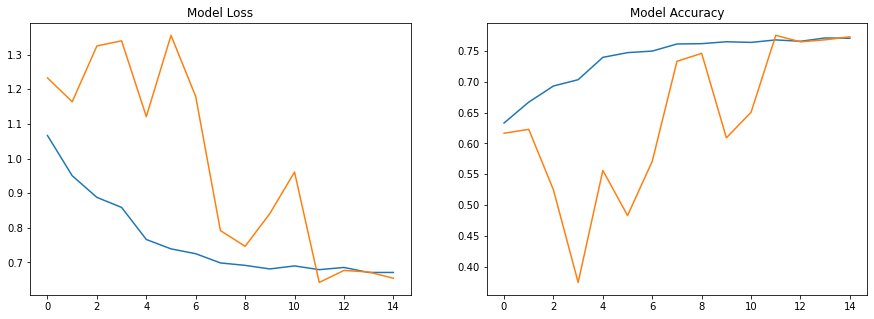

In [16]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_accuracy'][-1])

results = pd.DataFrame(history.history)

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(results[['loss', 'val_loss']])
axs[0].set_title('Model Loss')

axs[1].plot(results[['accuracy', 'val_accuracy']])
axs[1].set_title('Model Accuracy')

plt.show()

In [17]:
pred = model.predict(validation_generator)
predictions = np.argmax(pred, axis=1)
actual = validation_generator.classes

from sklearn.metrics import classification_report

report = classification_report(actual, predictions, target_names=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])
print(report)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_141997 in device /job:

In [18]:
test = pd.read_csv('../input/cassava-leaf-disease-classification/sample_submission.csv')

In [19]:
test_path = '../input/cassava-leaf-disease-classification/test_images'

def test_image_path(image):
    return os.path.join(test_path,image)

test['image_id'] = test['image_id'].apply(test_image_path)

test['label'] = test['label'].astype('str')

In [20]:
test_generator = test_gen.flow_from_dataframe(dataframe=test, directory=None, x_col='image_id', y_col='label',
                                              preprocessing_function=applications.vgg16.preprocess_input,
                                              class_mode='categorical', target_size=(image_size,image_size))

Found 1 validated image filenames belonging to 1 classes.


In [21]:
output = model.predict(test_generator)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

In [22]:
submission = pd.DataFrame()
submission['image_id'] = list(os.listdir(test_path))
submission['label'] = np.argmax(output, axis=1)
submission.to_csv("submission.csv", index=False)

In [23]:
submission.head()

,image_id,label
0,2216849948.jpg,4


In [24]:
model.save(save_model_filename)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


In [ ]:
# 15 epochs in total

In [25]:
save_model_filename = 'effnet_second.h5'

In [ ]:
epoch = 20

history = model.fit(
    train_generator,
    epochs=epoch,
    batch_size=batch_size,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

  76/2140 [>.............................] - ETA: 8:04 - loss: 0.7015 - accuracy: 0.7747Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 119/2140 [>.............................] - ETA: 7:56 - loss: 0.6717 - accuracy: 0.7836Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 162/2140 [=>............................] - ETA: 7:46 - loss: 0.6788 - accuracy: 0.7793Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


 182/2140 [=>............................] - ETA: 7:43 - loss: 0.6772 - accuracy: 0.7795Executing op __inference_train_function_35180 in device /job:localhost/replica:0/task:0/device:GPU:0


In [ ]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_accuracy'][-1])

results = pd.DataFrame(history.history)

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(results[['loss', 'val_loss']])
axs[0].set_title('Model Loss')

axs[1].plot(results[['accuracy', 'val_accuracy']])
axs[1].set_title('Model Accuracy')

plt.show()

In [ ]:
pred = model.predict(validation_generator)
predictions = np.argmax(pred, axis=1)
actual = validation_generator.classes

from sklearn.metrics import classification_report

report = classification_report(actual, predictions, target_names=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])
print(report)

In [ ]:
output = model.predict(test_generator)

In [ ]:
print(np.argmax(output, axis=1))